In [1]:
import faiss

In [2]:
import pandas as pd

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import os
from glob import glob

In [3]:
data_path = '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled'

In [14]:
folders = []
with os.scandir(data_path) as folder_list:
    for folder in folder_list:
        if(folder.is_dir()):
            folders = folders + [folder.path]

In [15]:
i = 0
time = 0
for folder in folders:

    if (folder == '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 350 (rescan).vsi - 20x'):

        time = i
    i = i+1
print(time)

168


In [23]:
print(folders[180:200])

['/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 24 (without ink).vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 176.vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 401.vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 699.vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 221 (rescan).vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 9.vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 160.vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 285.vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 449.vsi - 20x', '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 211.vsi - 20x', '/mnt/largedrive0/katariap/fe

In [6]:
from img2vec_pytorch import Img2Vec
from PIL import Image

# Initialize Img2Vec with GPU
img2vec = Img2Vec(cuda=True,model='densenet')

/mnt/largedrive0/katariap/feature_extraction/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:

patches = []
patches = glob(folders[0]+'/**/*.png',recursive = True)
# Read in an image (rgb format)
img = Image.open(patches[0])
# Get a vector from img2vec, returned as a torch FloatTensor
vec = img2vec.get_vec(img, tensor=False)
print(type(vec))
print(vec)

# images = []
# for img in patches:
#     images = images + [Image.open(img)]
# # Or submit a list
# vectors = img2vec.get_vec(images)

<class 'numpy.ndarray'>
[ 5.0973453e-05  3.8082921e-06  8.5155584e-04 ...  1.4375259e+00
 -7.0076245e-01  6.2407690e-01]


In [ ]:


def image_feature_extractor(path_tiled,model):

    patches = []
    patches = glob(path_tiled+'/**/*.png',recursive = True)
    print("Number of Patches For the Image are : {}".format(len(patches)))
    feature_dictionary = {}

    i = 0
    for patch in patches:
        try:
            image = load_img(patch,target_size=(224,224))
            image = np.array(image)
            reshaped_image = image.reshape(1,224,224,3)
            image_processed = preprocess_input(reshaped_image)
            feature_vector = model.predict(image_processed, use_multiprocessing = True,workers = 200)
            feature_dictionary[patch] = feature_vector[0].tolist()
            # print(patch)
        except:
            print(patch)
            continue

        if(i % 100 == 0):
            print("Features Extrated of {} Patches".format(i))
        i = i + 1
    print("Feature Extraction for Image {} Done! ".format(path_tiled))

    file_name = path_tiled.split('/')[-1] + '_feature_vector_vgg16.json'
    with open(os.path.join('/mnt/largedrive0/katariap/feature_extraction/data/Dataset/VGG_features',file_name),"w") as file:
        file.write(json.dumps(feature_dictionary)) 


# processes = []
# # manager = multiprocessing.Manager()
# # return_dict = manager.dict()

# for folder in folders:

#     # feature_analyzer(i)
#     p = multiprocessing.Process(target = image_feature_extractor,args=(folder,model))
#     processes.append(p)
#     p.start()

# for process in processes:
#     process.join()

for folder in folders:
    image_feature_extractor(folder,model)


In [ ]:
file_dict = pd.read_pickle('/mnt/largedrive0/katariap/feature_extraction/data/Dataset/kimianet_features/FineTuned_Model_Features_dict.pickle')
df = pd.DataFrame(file_dict.items(),columns=['Name','Feature_Value'])
slide_data = {}
patch_list = df['Name'].to_list()
feature_list = df['Feature_Value'].to_list()

In [ ]:
pca = PCA(n_components=100,random_state=13)
pca.fit(feature_list)
values_transformed = pca.transform(feature_list)

X = values_transformed


Silhoutte Algorithm

In [ ]:
n_clusters = 15
clusterer = KMeans(n_clusters=n_clusters, random_state=10)
cluster_labels = clusterer.fit_predict(X)
silhouette_avg = silhouette_score(X, cluster_labels)
print(
    "For n_clusters =",
    n_clusters,
    "The average silhouette_score is :",
    silhouette_avg,
)

In [33]:
feature_vector_file = '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/DenseNet_Features'

In [34]:
densenet_features_files = glob(feature_vector_file+'/*.json')

In [36]:
print(len(densenet_features_files))

200


In [26]:
import json

In [63]:
feature_values = []
file_names = []
for feature_file in densenet_features_files:
    with open(feature_file,"r") as file:
        feature_dictionary = json.loads(file.read())
    
    feature_values = feature_values + [np.array(list(feature_dictionary.values()))]
    file_names = file_names + [np.array(list(feature_dictionary.keys()))]



In [ ]:
feature_list = []
file_list = []
i = 0
for folder in feature_values:
    for file in folder:
        feature_list = feature_list + [file]
    i = i + 1
    print(i)
    

In [65]:
print(len(feature_list))

418500


In [90]:
print(file_names[0])

['/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 167.vsi - 20x/Sample 167.vsi - 20x [x=81000,y=39000,w=1000,h=1000].png'
 '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 167.vsi - 20x/Sample 167.vsi - 20x [x=66000,y=53000,w=1000,h=1000].png'
 '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 167.vsi - 20x/Sample 167.vsi - 20x [x=44000,y=55000,w=1000,h=1000].png'
 ...
 '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 167.vsi - 20x/Sample 167.vsi - 20x [x=16000,y=58000,w=1000,h=1000].png'
 '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 167.vsi - 20x/Sample 167.vsi - 20x [x=49000,y=46000,w=1000,h=1000].png'
 '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Images_Tiled/Sample 167.vsi - 20x/Sample 167.vsi - 20x [x=85000,y=22000,w=1000,h=1000].png']


In [91]:

file_list = []
i = 0
for folder in file_names:
    for file in folder:
        file_list = file_list + [file]
    i = i + 1
    print(i)


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200


In [50]:
feature_values_original = feature_values

In [45]:
feature_values = np.array(feature_values,dtype=object)

In [52]:
print(len(feature_values))

200


In [ ]:
# random training data 
mat = faiss.PCAMatrix (1024, 500)
mat.train(np.array(feature_list).astype('float32'))
assert mat.is_trained
feature_values_transformed = mat.apply(np.array(feature_list).astype('float32'))
# print this to show that the magnitude of tr's columns is decreasing


In [69]:
print(len(feature_values_transformed[0]))

500


In [28]:
print(len(file_names))

1785


In [ ]:
index = faiss.IndexFlatL2()
print(index.is_trained)

In [87]:
ncentroids = 20
niter = 20
verbose = True
kmeans = faiss.Kmeans(feature_values_transformed.shape[1], ncentroids, niter=niter, verbose=verbose)
kmeans.train(feature_values_transformed)

Sampling a subset of 5120 / 418500 for training
Clustering 5120 points in 500D to 20 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.71 s
  Iteration 19 (7.52 s, search 5.53 s): objective=787503 imbalance=1.148 nsplit=0           


787503.0625

In [88]:
D, I = kmeans.index.search(feature_values_transformed, 1)

In [82]:
print(len(feature_values_transformed))

418500


In [76]:
d = feature_values_transformed.shape[1]

In [77]:
index = faiss.IndexFlatL2 (d)
index.add (feature_values_transformed)
D_c, I_c = index.search (kmeans.centroids, 20)

In [79]:
print(I[1])

[ 71136 280747   4535 221709 219130 315835 130442 123649  67904   4285
 288625 312742 325339  11450 295926 129844 124095 342786 178399  69004]


In [93]:
data_frame = pd.DataFrame(file_list,columns = ['filename'])
data_frame['Cluster'] = I
data_frame['Distance'] = D
data_frame.to_csv('/mnt/largedrive0/katariap/feature_extraction/data/Dataset/Clusters_densenet.csv')

In [94]:
import pickle

In [102]:
print(I[100])

[13]


In [103]:
clusters = {}
for i in range(len(file_list)):
    
    if (I[i] not in list(clusters.keys())):
        
        clusters[I[i][0]] = [file_list[i]]
    else:
        clusters[I[i][0]] = clusters[I[i][0]] + [file_list[i]]




In [5]:
import pickle

In [6]:
clusters = {}
cluster_file = '/mnt/largedrive0/katariap/feature_extraction/data/Dataset/clusters.pickle'
with open(cluster_file,'rb') as data_file:
    clusters = pickle.load(data_file)
    


In [7]:
final_list = []
selected_clusters = [1,2,4,6,7,8,9,10,11,12,13,17,18,19]
for i in selected_clusters:
    final_list = final_list + clusters[i]

In [8]:
selected_patches = pd.DataFrame(final_list, columns = ['Patch'])

In [9]:
selected_patches.to_csv('/mnt/largedrive0/katariap/feature_extraction/data/Dataset/selected_after_clustering.csv')

In [104]:
with open('/mnt/largedrive0/katariap/feature_extraction/data/Dataset/clusters.pickle', 'wb') as file:
    pickle.dump(clusters, file)

In [15]:
from PIL import Image
import random

In [ ]:
files = clusters[15]
print(len(files))
files = random.sample(files,60)

for index,file in enumerate(files):
    plt.subplot(10,10,index+1)
    img = Image.open(file)
    img = np.array(img)
    plt.imshow(img)
 

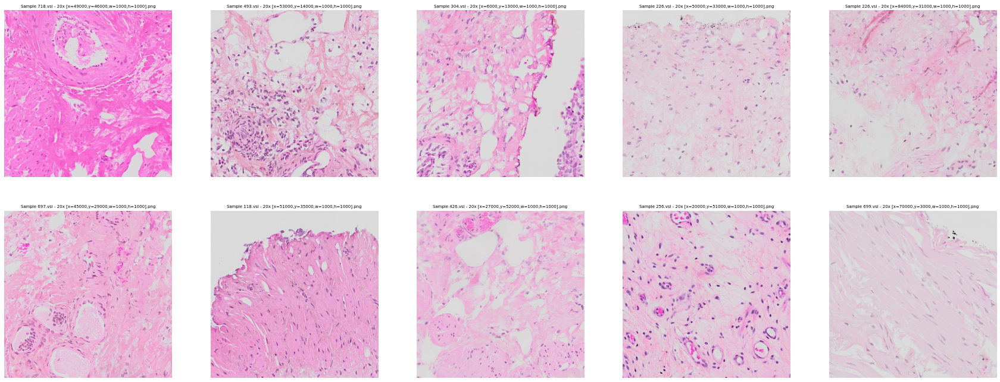

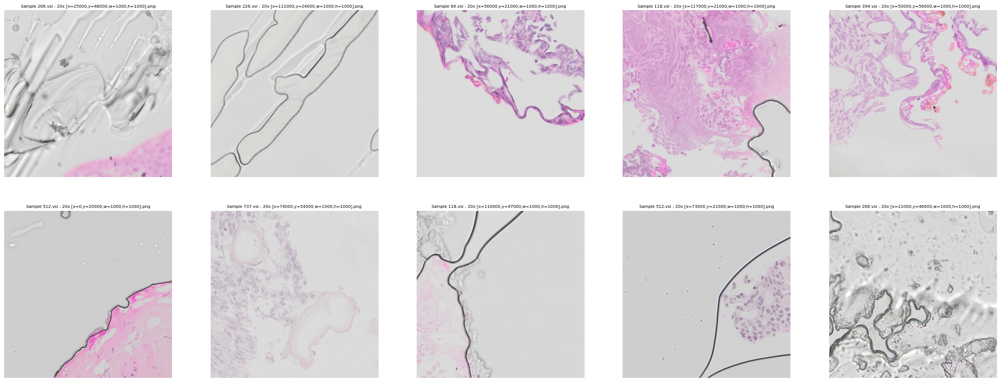

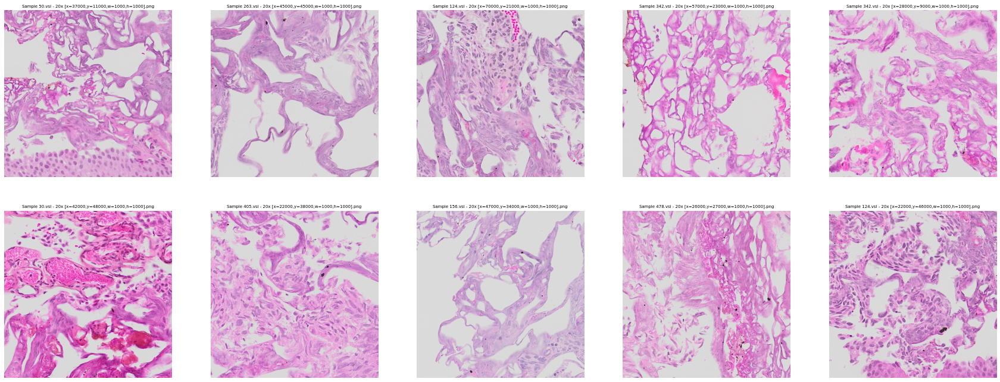

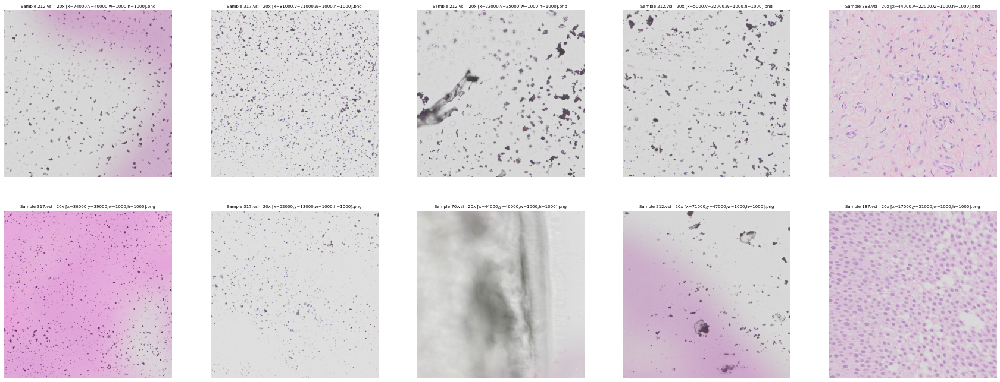

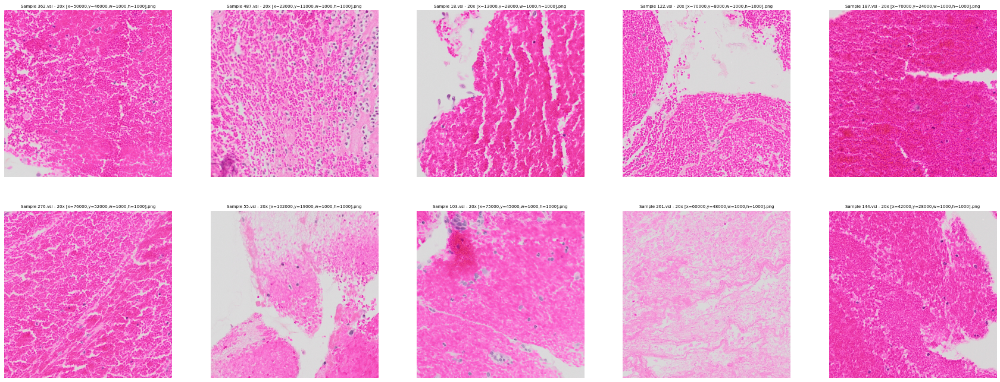

In [17]:
for number in [3,5,14,15,16]:

        fig = plt.figure(figsize = (30,30))
        files = clusters[number]
        # print(files[0])
        # print(len(files))

        if len(files) > 10:
            files = random.sample(files,10)
        for index,file in enumerate(files):
            plt.subplot(5,5,index+1)
            name = file.split('/')[-1]
            img = Image.open(file)
            img = np.array(img)
            plt.imshow(img)
            plt.axis('off')
            plt.title(name ,fontsize = 7)

In [ ]:
range_n_clusters = [10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    # fig, (ax1, ax2) = plt.subplots(1, 2)
    # fig.set_size_inches(18, 7)

   
    # ax1.set_xlim([-0.1, 1])
   
    # ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])


    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

 
#     sample_silhouette_values = silhouette_samples(X, cluster_labels)

#     y_lower = 10
#     for i in range(n_clusters):

#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

#         ith_cluster_silhouette_values.sort()

#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i

#         color = cm.nipy_spectral(float(i) / n_clusters)
#         ax1.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )

#         # Label the silhouette plots with their cluster numbers at the middle
#         ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

#         # Compute the new y_lower for next plot
#         y_lower = y_upper + 10  # 10 for the 0 samples

#     ax1.set_title("The silhouette plot for the various clusters.")
#     ax1.set_xlabel("The silhouette coefficient values")
#     ax1.set_ylabel("Cluster label")

#     # The vertical line for average silhouette score of all the values
#     ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

#     ax1.set_yticks([])  # Clear the yaxis labels / ticks
#     ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

#     # 2nd Plot showing the actual clusters formed
#     colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
#     ax2.scatter(
#         X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
#     )

#     # Labeling the clusters
#     centers = clusterer.cluster_centers_
#     # Draw white circles at cluster centers
#     ax2.scatter(
#         centers[:, 0],
#         centers[:, 1],
#         marker="o",
#         c="white",
#         alpha=1,
#         s=200,
#         edgecolor="k",
#     )

#     for i, c in enumerate(centers):
#         ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

#     ax2.set_title("The visualization of the clustered data.")
#     ax2.set_xlabel("Feature space for the 1st feature")
#     ax2.set_ylabel("Feature space for the 2nd feature")

#     plt.suptitle(
#         "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
#         % n_clusters,
#         fontsize=14,
#         fontweight="bold",
#     )

# plt.show()